In [62]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter,LatitudeFormatter
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import cmap
import cartopy.feature as cFeature

## Load climate variables for specified area and model run

In [63]:
# Define dataset specifics

model_scenario_name = 'NorESM2-LM_ssp126' # Choose a model and SSP scenario
area_name = 'norway' # Choose an area

# Defines start and end of time slice by picking 20 years before and 20 years after abrupt SPG cooling
if model_scenario_name == 'NorESM2-LM_ssp126':
    start_time = '2015-01-01'; end_time = '2055-01-01'
    time_array = np.arange(2015, 2055, 1)
elif model_scenario_name == 'CESM2-WACCM_ssp126':
    start_time = '2020-01-01'; end_time = '2060-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'MRI-ESM2_ssp245':
    start_time = '2020-01-01'; end_time = '2060-01-01'
    time_array = np.arange(2020, 2060, 1)
else:
    print("This dataset is not considered in the current study, but can be added to the analysis")

data_folder = '../climatic_indices/' # Folder where computed climate indices are stored


# Load climate indicies

clim_idx = xr.open_mfdataset(data_folder+'*_'+area_name+'_'+model_scenario_name+'.nc', decode_timedelta=False)
clim_idx.load()


<xarray.Dataset> Size: 600kB
Dimensions:  (lat: 8, lon: 13, time: 40)
Coordinates:
  * lat      (lat) float64 64B 57.79 59.68 61.58 63.47 65.37 67.26 69.16 71.05
  * lon      (lon) float64 104B 2.5 5.0 7.5 10.0 12.5 ... 25.0 27.5 30.0 32.5
  * time     (time) int64 320B 2015 2016 2017 2018 2019 ... 2051 2052 2053 2054
Data variables: (12/18)
    CDD      (lat, lon, time) float64 33kB 20.0 15.0 35.0 ... 15.0 14.0 15.0
    CWDI     (lat, lon, time) float64 33kB 1.0 1.0 3.0 0.0 ... 1.0 0.0 0.0 2.0
    CWD      (lat, lon, time) float64 33kB 20.0 26.0 18.0 ... 18.0 26.0 17.0
    FD       (lat, lon, time) float64 33kB 0.0 4.0 2.0 2.0 ... 154.0 151.0 154.0
    GDD      (lat, lon, time) float64 33kB 1.541e+03 1.785e+03 ... 158.7 184.2
    GSL      (lat, lon, time) float64 33kB 46.0 29.0 13.0 ... 98.0 71.0 27.0
    ...       ...
    SDII     (lat, lon, time) float64 33kB 5.06 4.64 5.528 ... 2.995 3.791 2.959
    SU       (lat, lon, time) float64 33kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    TNmin    (lat, lon, time) float64 33kB 0.2114 -2.722 ... -8.433 -15.13
    TR       (lat, lon, time) float64 33kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    TXmax    (lat, lon, time) float64 33kB 15.94 16.18 18.03 ... 14.17 11.59
    WSDI     (lat, lon, time) float64 33kB 1.0 2.0 4.0 2.0 ... 5.0 7.0 2.0 4.0

## Plot timeseries for specific grid point

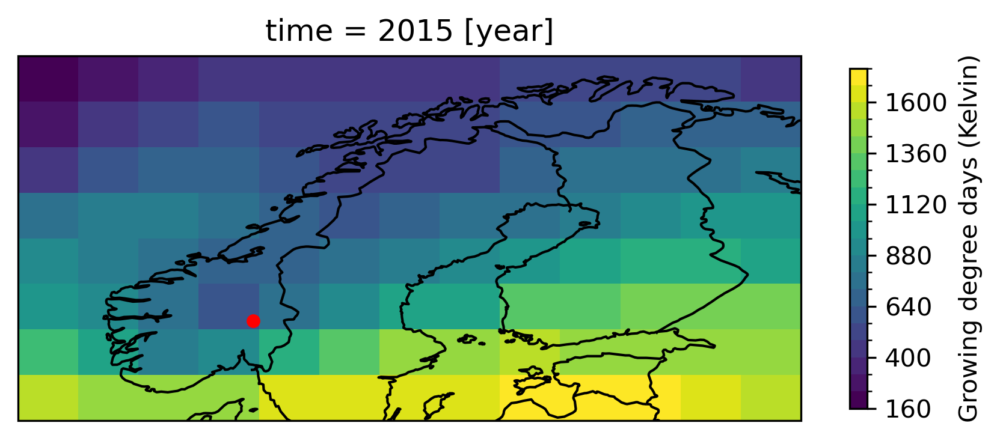

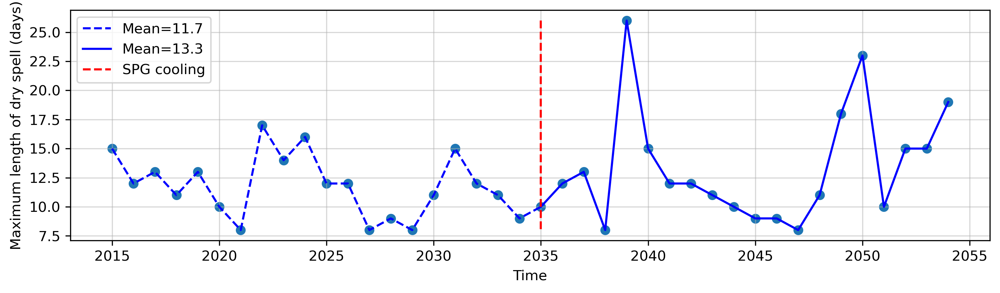

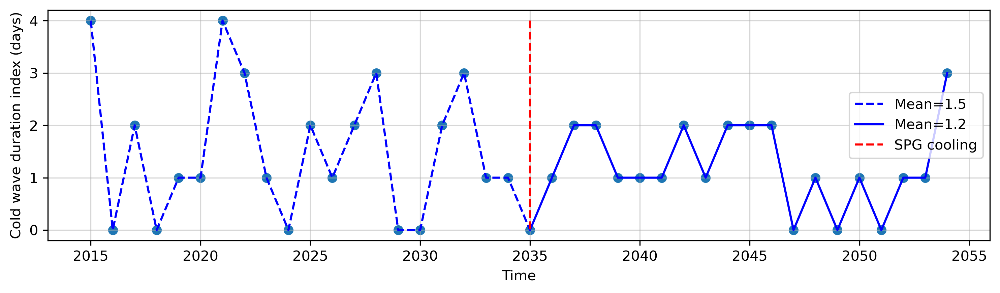

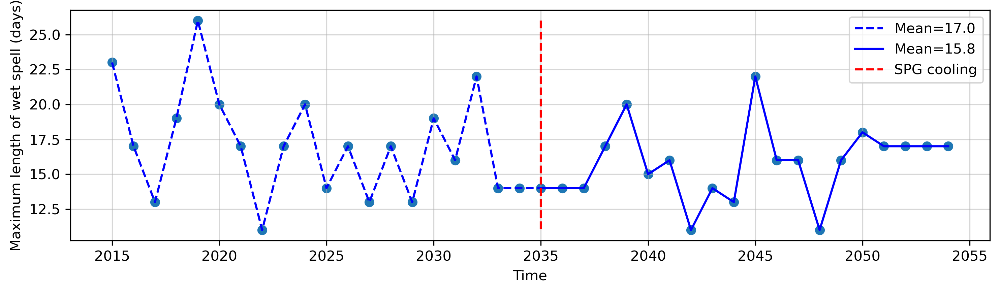

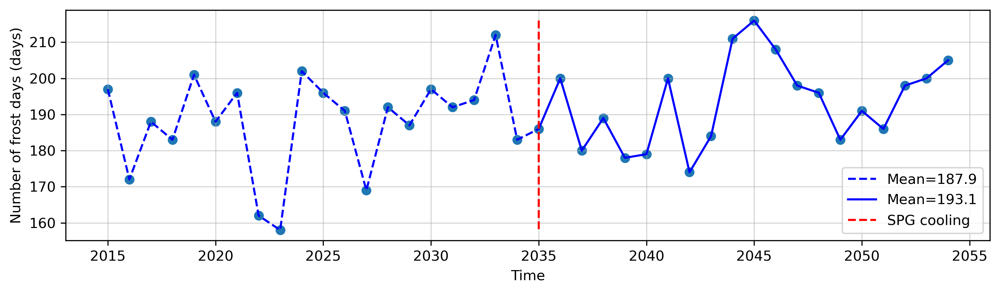

...

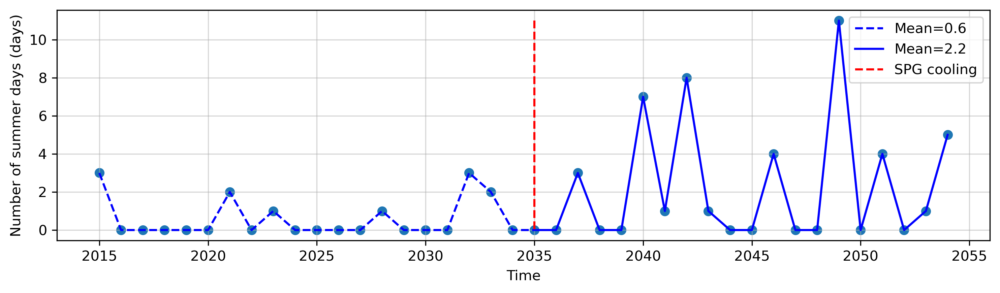

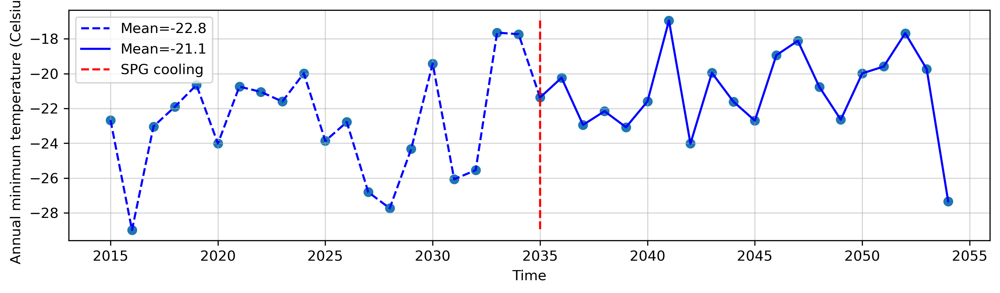

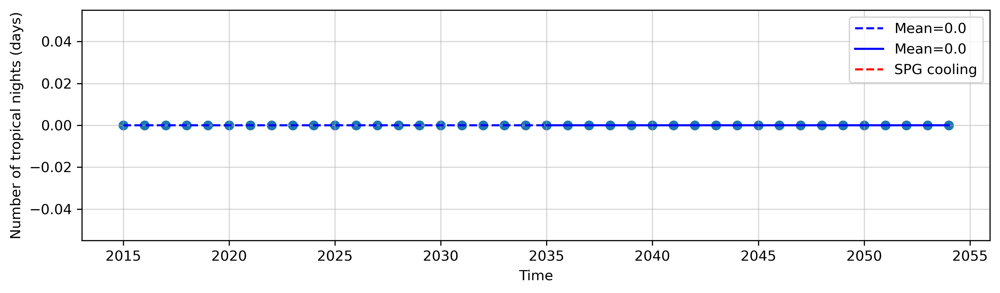

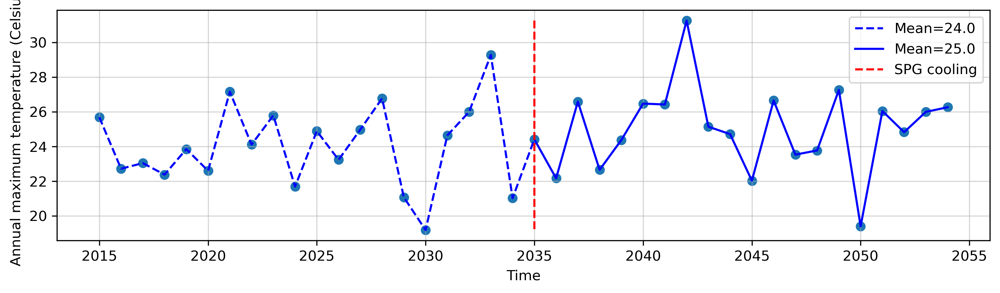

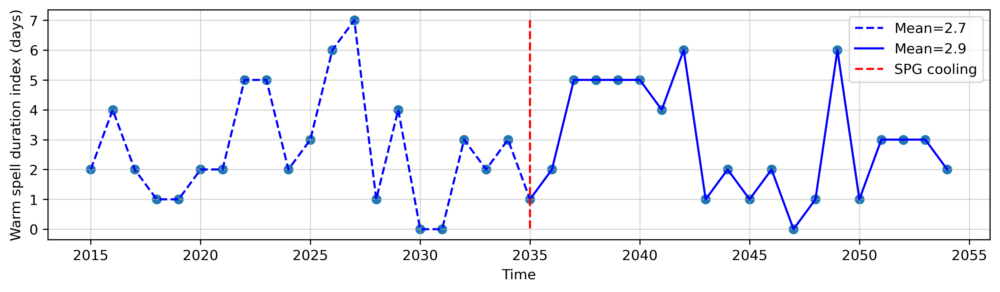

In [64]:
save_folder = '../figures/time_series/' # Folder where figures should be saved
os.makedirs(save_folder, exist_ok=True) 

# Choose grid point

lat = 61; lon = 11
point_name = 'Hamar'

# Choose variables

variable_list = list(clim_idx.keys())

# Plot map of grid point
variable_name = 'GDD'
da = xr.open_dataset(data_folder+variable_name+'_'+area_name+'_'+model_scenario_name+'.nc', decode_timedelta={variable_name : False})
fig = plt.figure(1, figsize=(7,7),dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
data = da[variable_name].isel(time=0)
map = data.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=21, 
                cbar_kwargs={'orientation':'vertical','shrink':0.35, 'aspect':20,'label':clim_idx[variable_name].description +' ('+clim_idx[variable_name].units+')'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.scatter(lon, lat, s=20, c='r', marker='o', linewidths=1, transform=ccrs.PlateCarree())

# Plotting

for variable in variable_list:
    fig = plt.figure(figsize=[10, 3],dpi=300)
    values = clim_idx[variable].sel(lat=lat, lon=lon, method='nearest')
    plt.scatter(clim_idx.time, values)
    plt.plot(clim_idx.time[:21], values[:21], color='blue',linestyle='--', label='Mean='+str(np.round(float(np.mean(values[:21])),1)))
    plt.plot(clim_idx.time[20:], values[20:], color='blue',linestyle='-', label='Mean='+str(np.round(float(np.mean(values[20:])),1)))
    plt.vlines(clim_idx.time[0]+20, max(values), min(values), color='red', linestyle='--', label='SPG cooling')
    plt.xlabel('Time')
    plt.ylabel(clim_idx[variable].description +' ('+clim_idx[variable].units+')')
    plt.grid(alpha=0.5)
    plt.legend()
    fig.tight_layout()
    plt.savefig(save_folder+variable+'_'+point_name+'.png')
    plt.show()


## Plot difference maps of climate indices

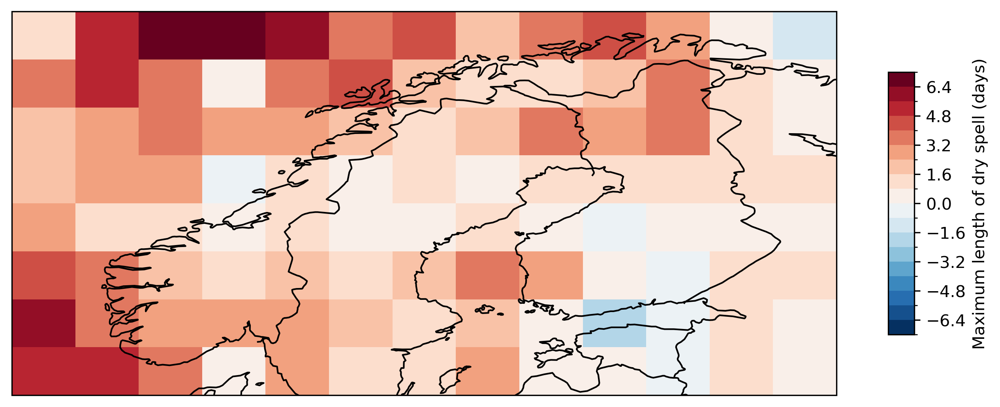

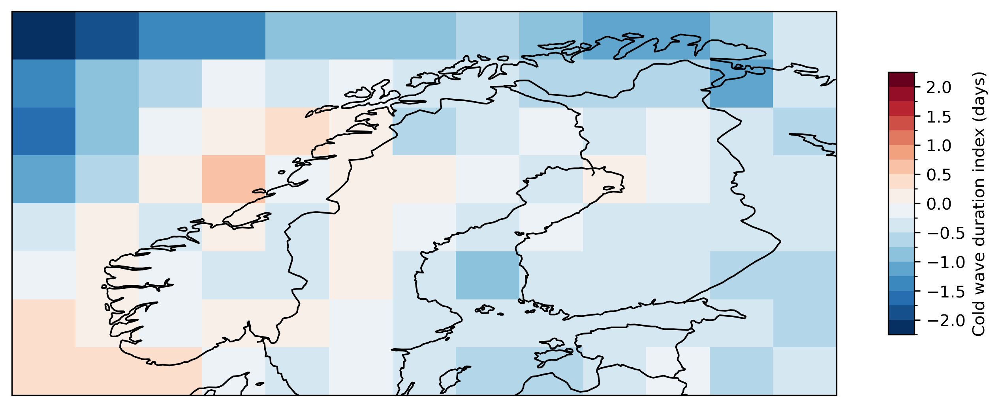

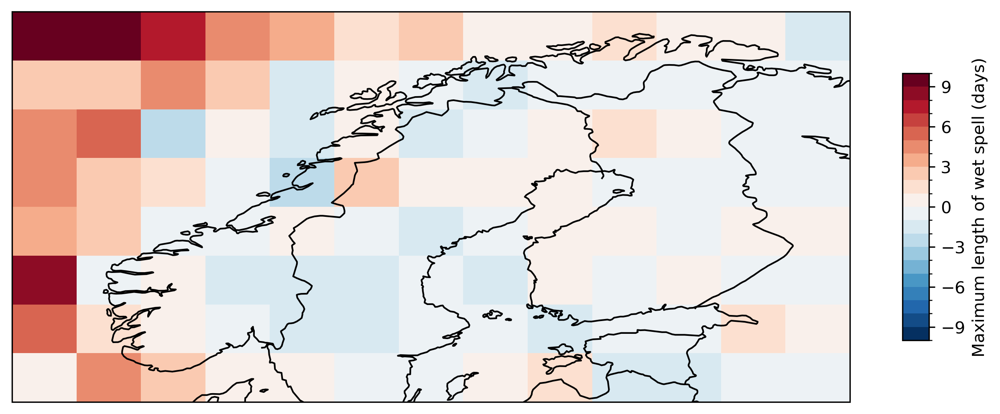

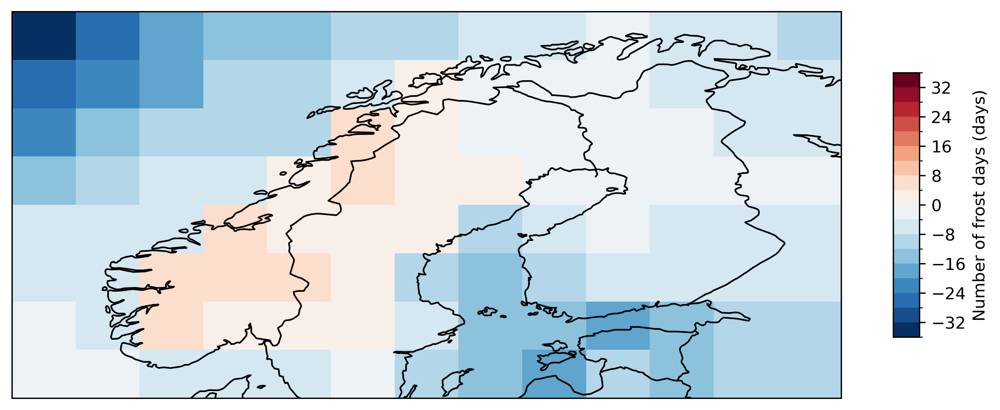

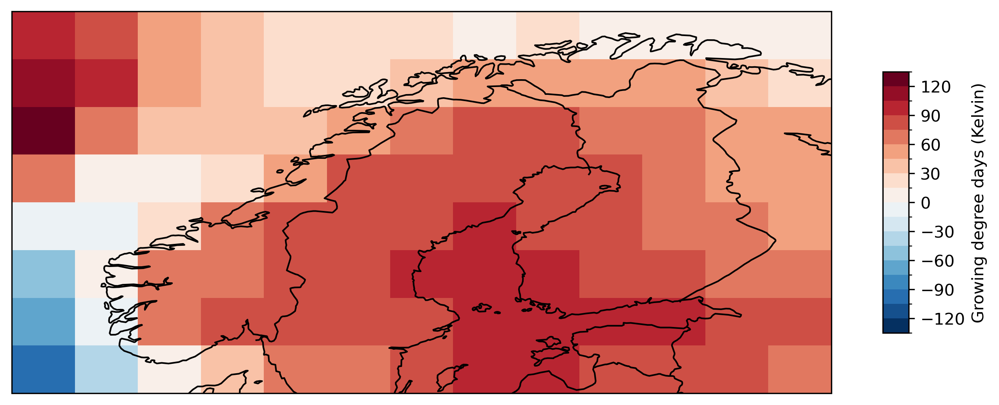

...

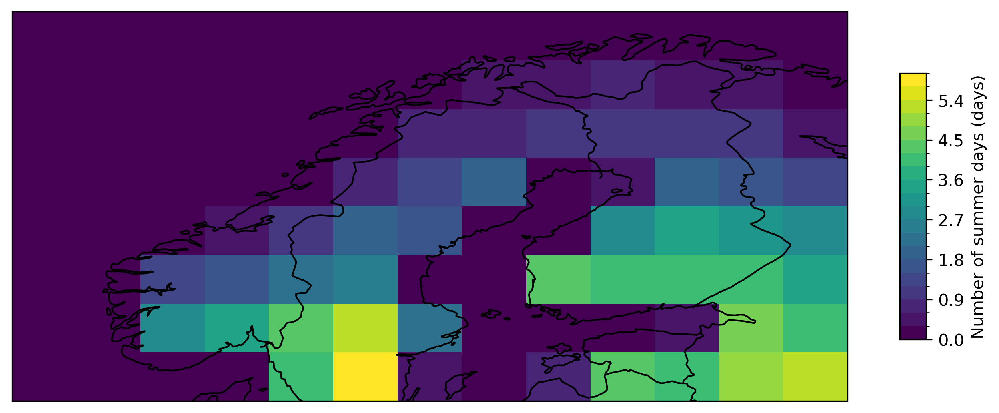

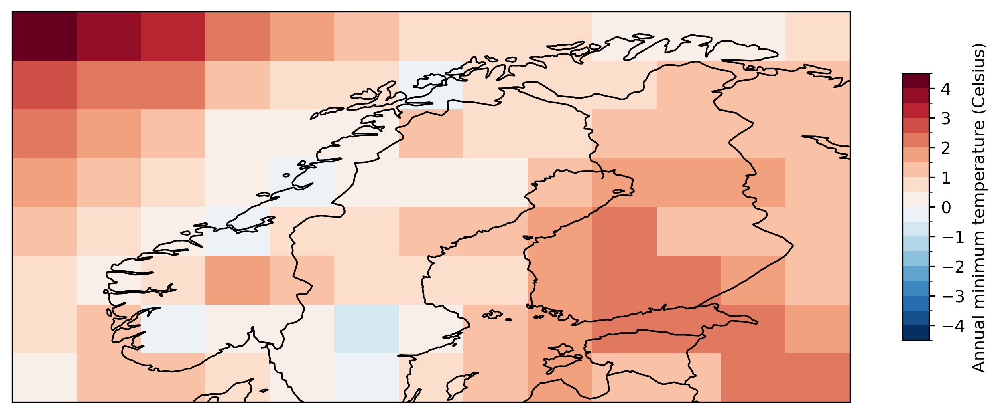

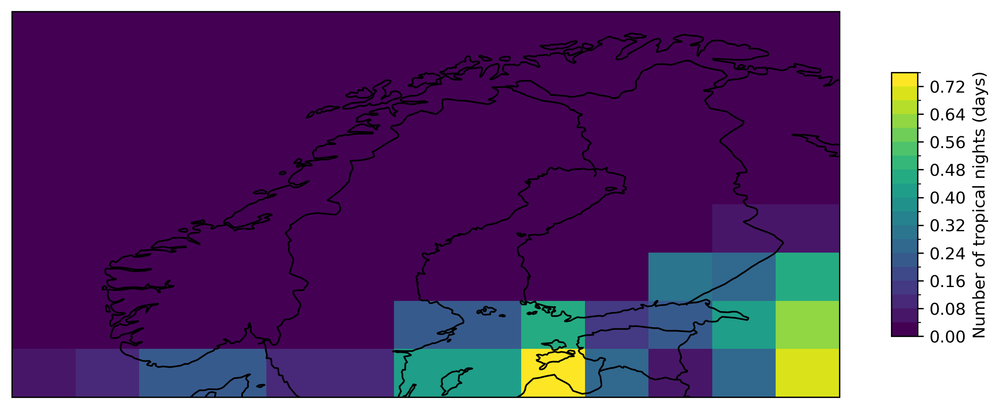

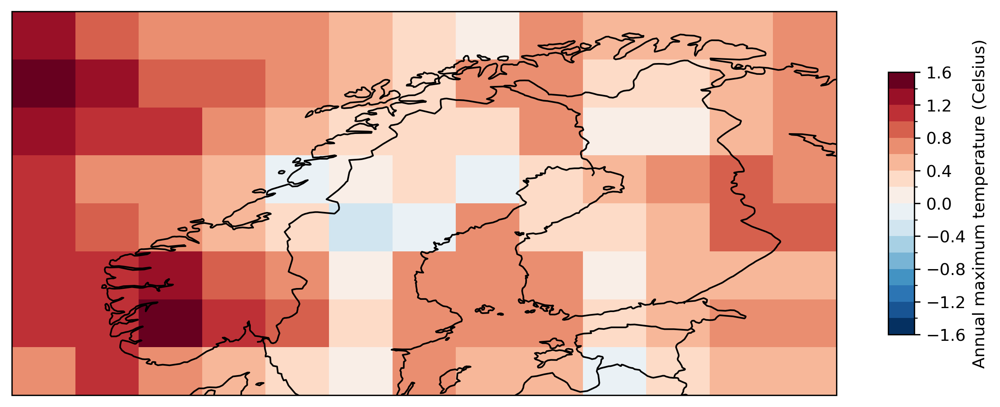

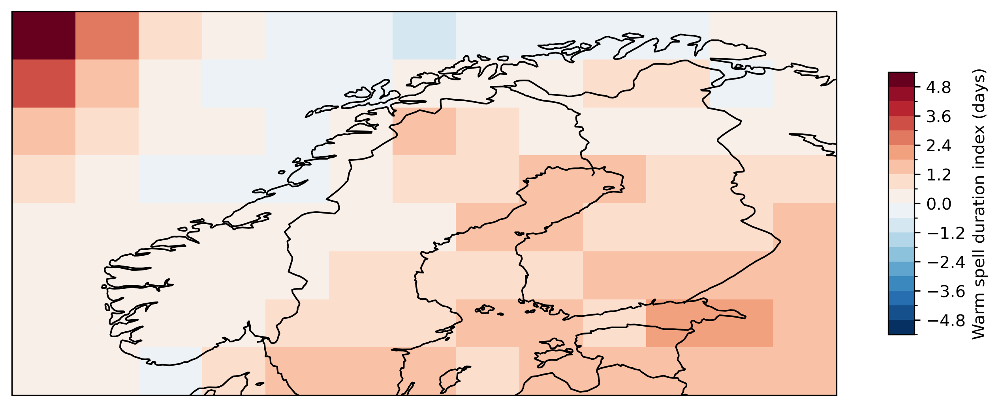

In [65]:
save_folder = '../figures/maps/' # Folder where figures should be saved
os.makedirs(save_folder, exist_ok=True) 

# Choose variables

variable_list = list(clim_idx.keys())

# Plotting

for variable in variable_list:
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = clim_idx[variable].isel(time=slice(20,40)).mean("time") - clim_idx[variable].isel(time=slice(0,20)).mean("time")
    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=21, 
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':clim_idx[variable].description +' ('+clim_idx[variable].units+')'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    fig.tight_layout()
    plt.savefig(save_folder+variable+'_'+area_name+'_'+model_scenario_name+'.png')
    plt.show()

## Plot maps on globe

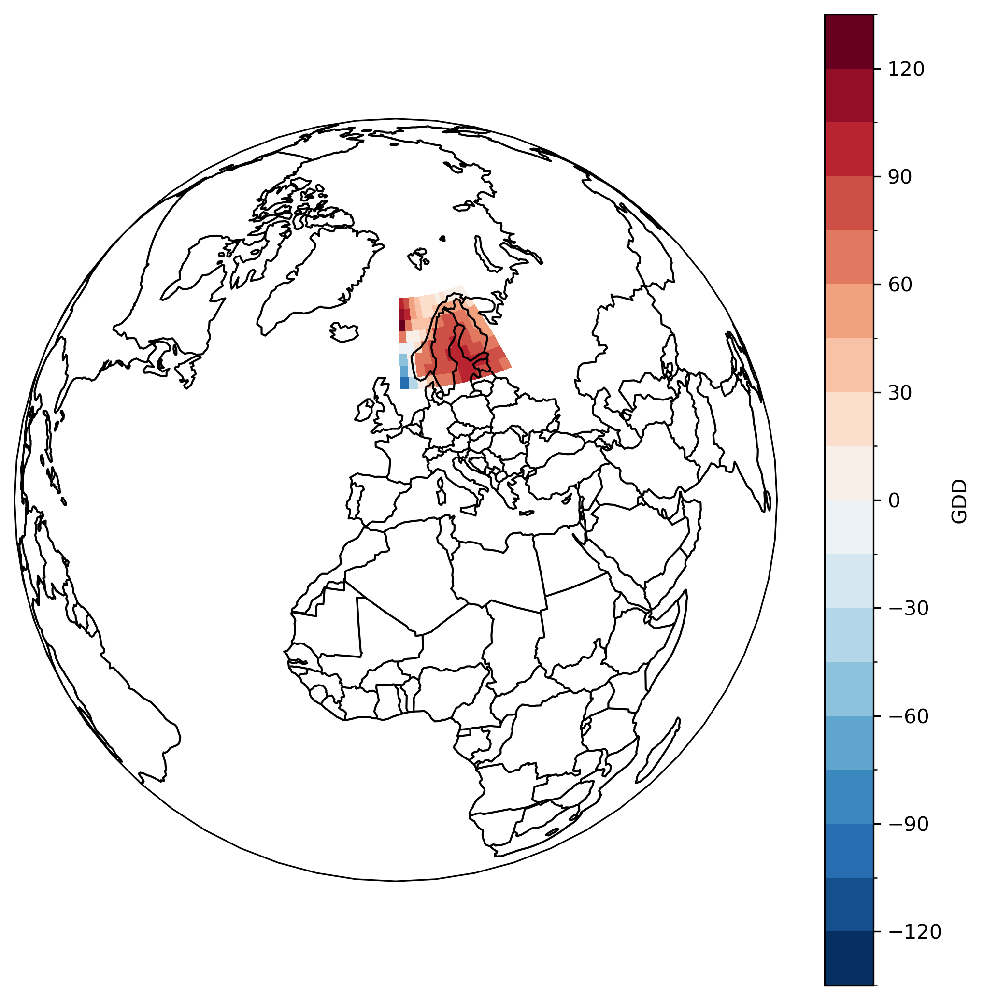

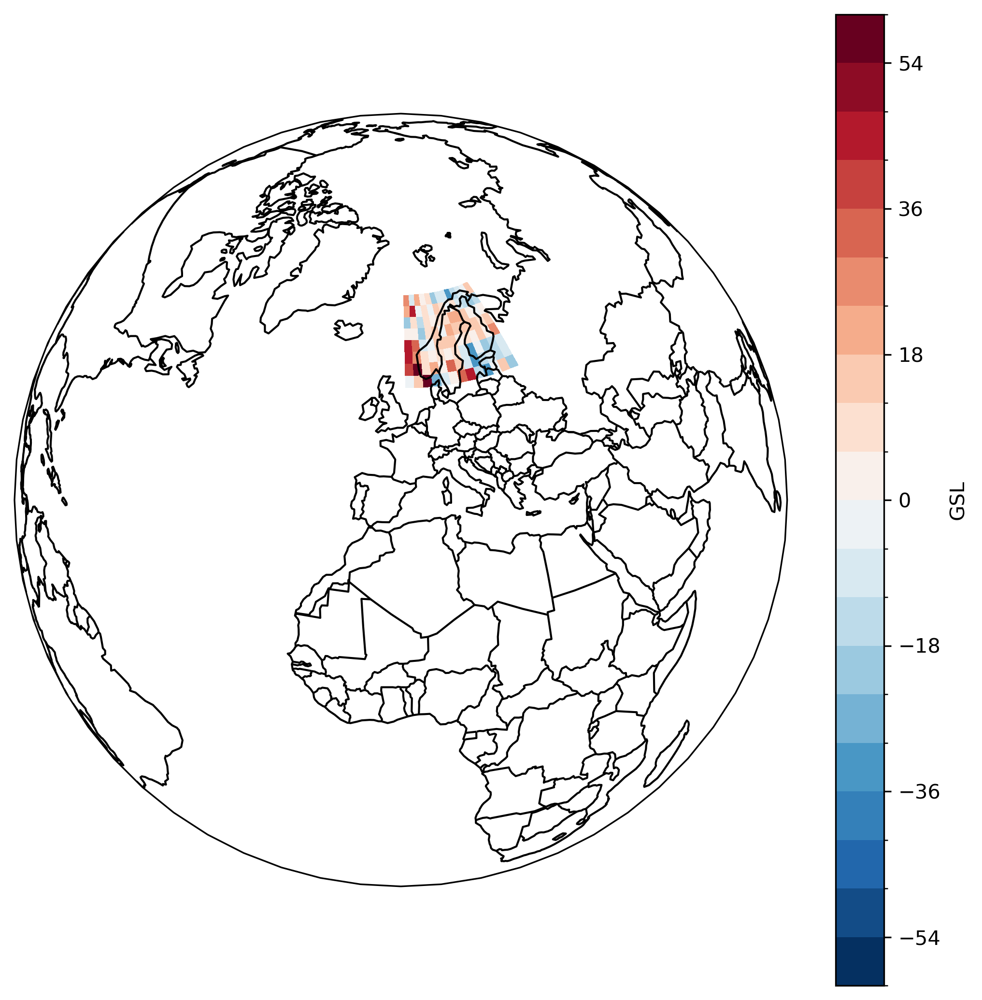

In [27]:
save_folder = '../figures/maps/' # Folder where figures should be saved
os.makedirs(save_folder, exist_ok=True) 

# Choose variables

variable_list = ['GDD','GSL']

# Plotting

for variable in variable_list:
    fig = plt.figure(figsize=[7, 7], dpi=300)
    #ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    #ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.axes(projection=ccrs.Orthographic(0,40))
    ax.set_global()
    diff = clim_idx[variable].isel(time=slice(20,40)).mean("time") - clim_idx[variable].isel(time=slice(0,20)).mean("time")
    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=21)
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    fig.tight_layout()
    #plt.savefig(save_folder+variable+'_'+point_name+'.png')
    plt.show()